**Utilise Tensorflow v2**

/!\ Attention, avec Tensorflow v2.14, l'installation du GPU ne fonctionne pas

# Paramétrage

## Librairies

**/!\ ATTENTION:** en règle générale, les modèles sauvegardés avec une version donnée de Tensorflow ne peuvent pas être chargés avec les versions suivantes


In [ ]:
!pip install tensorflow==2.15.0 rasterio plotly scikit-image shapely

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 42.8 MB/s eta 0:00:00


In [ ]:
import rasterio
import numpy as np
import glob
import plotly.express as px
import plotly.graph_objs as go
import cv2
import pandas as pd
import geopandas as gpd
import tqdm
from datetime import date
from google.colab import drive
import random
import matplotlib.pyplot as plt
import shapely
import os
import math

import skimage as ski
from skimage.measure import find_contours, approximate_polygon, subdivide_polygon, label

from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, accuracy_score
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.pipeline import Pipeline

import tensorflow as tf
from tensorflow import image as tf_image
from tensorflow import data as tf_data
from tensorflow import io as tf_io

import keras
from keras import layers, Model
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Input, Rescaling, Dense, Dropout, Flatten, Conv2D, Conv2DTranspose, \
MaxPooling2D, AveragePooling2D, SpatialDropout2D, BatchNormalization, Activation, SeparableConv2D, \
UpSampling2D, GlobalAveragePooling2D
from keras.models import Sequential, load_model
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from keras.utils import load_img, img_to_array, array_to_img


## Données

**Partie spécifique Google Colab**

Si nécessaire, mounter Google Drive

In [ ]:
# partie spécifique Google Colab
!mkdir -p /content/data/decoupe_final
!cp /content/drive/MyDrive/data/DST/df_decoupe_final.csv /content/data/decoupe_final/df_decoupe_final.csv
!unzip /content/drive/MyDrive/data/DST/decoupe_final.zip -d /content/data/decoupe_final

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
 extracting: /content/data/decoupe_final/decoupe_final/69-2020_8_834400.0_22_6508200.0_33.cpg  
  inflating: /content/data/decoupe_final/decoupe_final/69-2020_8_834400.0_22_6508200.0_33.dbf  
  inflating: /content/data/decoupe_final/decoupe_final/69-2020_8_834400.0_22_6508200.0_33.jp2  
  inflating: /content/data/decoupe_final/decoupe_final/69-2020_8_834400.0_22_6508200.0_33.prj  
  inflating: /content/data/decoupe_final/decoupe_final/69-2020_8_834400.0_22_6508200.0_33.shp  
  inflating: /content/data/decoupe_final/decoupe_final/69-2020_8_834400.0_22_6508200.0_33.shx  
 extracting: /content/data/decoupe_final/decoupe_final/69-2020_8_834400.0_22_6508200.0_33_data.jpg  
  inflating: /content/data/decoupe_final/decoupe_final/69-2020_8_834400.0_22_6508200.0_33_data.jpg.aux.xml  
  inflating: /content/data/decoupe_final/decoupe_final/69-2020_8_834400.0_22_6508200.0_33_label.png  
  inflating: /content/data/decoupe

Chargement des données image

In [ ]:
data_path = '/content/data/decoupe_final'
images_path = '/content/data/decoupe_final/decoupe_final'
df_decoupe = pd.read_csv(data_path + '/df_decoupe_final.csv')
df_decoupe.head()

,dalle_X,dalle_Y,X,Y,X_size,Y_size,fichier_raster,fichier_img,fichier_mask,fichier_shapes,formes,multi,erreur
0,0,0,825000.0,6509800.0,1000,1000,69-2020_0_825000.0_0_6509800.0_0.jp2,69-2020_0_825000.0_0_6509800.0_0_data.jpg,69-2020_0_825000.0_0_6509800.0_0_label.png,69-2020_0_825000.0_0_6509800.0_0.shp,0,0,0
1,0,1,825000.0,6509600.0,1000,1000,69-2020_1_825000.0_0_6509600.0_0.jp2,69-2020_1_825000.0_0_6509600.0_0_data.jpg,69-2020_1_825000.0_0_6509600.0_0_label.png,69-2020_1_825000.0_0_6509600.0_0.shp,0,0,0
2,0,2,825000.0,6509400.0,1000,1000,69-2020_2_825000.0_0_6509400.0_4.jp2,69-2020_2_825000.0_0_6509400.0_4_data.jpg,69-2020_2_825000.0_0_6509400.0_4_label.png,69-2020_2_825000.0_0_6509400.0_4.shp,4,0,0
3,0,3,825000.0,6509200.0,1000,1000,69-2020_3_825000.0_0_6509200.0_4.jp2,69-2020_3_825000.0_0_6509200.0_4_data.jpg,69-2020_3_825000.0_0_6509200.0_4_label.png,69-2020_3_825000.0_0_6509200.0_4.shp,4,0,0
4,0,4,825000.0,6509000.0,1000,1000,69-2020_4_825000.0_0_6509000.0_19.jp2,69-2020_4_825000.0_0_6509000.0_19_data.jpg,69-2020_4_825000.0_0_6509000.0_19_label.png,69-2020_4_825000.0_0_6509000.0_19.shp,19,0,0


## Fonctions

In [ ]:
def sigmoid(x):
  return(1 / (1 + np.exp(-x)))

In [ ]:
def get_model_results(model, df_train, df_test, train_generator, test_generator, batch_size, saving_path):
  '''
  fonction qui calcule les résultats d'un modèle en utilisant des générateurs de données
  '''
  n_batchs_train = df_train.shape[0] // batch_size
  n_batchs_val = df_test.shape[0] // batch_size
  phase = []
  pred = []
  y = []
  print('calcul des prédictions sur les données d\'entraînement')
  for i in tqdm.tqdm(range(n_batchs_train)):
    images, labels = train_generator.next()
    pred += model.predict(images, verbose=0).flatten().tolist()
    y += labels.flatten().tolist()
    phase += ['train']*len(labels)

  print('calcul des prédictions sur les données de validation')
  for i in tqdm.tqdm(range(n_batchs_val)):
    images, labels = test_generator.next()
    pred += model.predict(images, verbose=0).flatten().tolist()
    y += labels.flatten().tolist()
    phase += ['validation']*len(labels)
  df_model_results = pd.DataFrame({
      'target': y,
      'prediction': pred,
      'phase': phase
  })
  df_model_results.to_csv(saving_path, index = False)
  return(df_model_results)

In [ ]:
def get_img_dataset(
    batch_size,
    img_size,
    input_img_paths,
    target_img_paths,
    binary_mask = False):
    '''
    fonction qui crée un générateur de données pour le modèle
    si binary_mask est à True, on met toutes les valeurs différentes de 0 du masque à 1
    '''

    def load_img_masks(input_img_path, target_img_path):
      input_img = tf.io.read_file(input_img_path)
      input_img = tf.io.decode_png(input_img, channels = 3)
      input_img = tf.image.resize(input_img, img_size)
      input_img = tf.image.convert_image_dtype(input_img, "float32")

      target_img = tf.io.read_file(target_img_path)
      # on ne garde qu'un des canaux R, G, B de l'image masque
      target_img = tf.io.decode_png(target_img, channels = 1)
      target_img = tf.image.resize(target_img, img_size, method="nearest")
      target_img = tf.image.convert_image_dtype(target_img, "uint8")
      if binary_mask:
        # on remplace toutes les valeurs différentes de 0 par "1"
        target_img = tf.where(tf.math.greater(target_img, 0), 1, 0)

      return input_img, target_img

    dataset = tf.data.Dataset.from_tensor_slices((input_img_paths, target_img_paths))
    dataset = dataset.map(load_img_masks, num_parallel_calls = tf.data.AUTOTUNE)
    return dataset.batch(batch_size)


In [ ]:
def show_segmentation_results(model, i_image, df_decoupe):
  '''
  fonction qui permet d'afficher côte à côte :
  - le masque prédit par le modèle
  - le masque de départ, avec le contour prédit par le modèle
  - l'image de départ, avec le contour prédit par le modèle
  '''
  val_image = img_to_array(load_img(
      images_path + '/' + df_decoupe['fichier_img'].values[i_image],
      target_size = resolution))
  val_target = img_to_array(load_img(
      images_path + '/' + df_decoupe['fichier_mask'].values[i_image],
      target_size = resolution))[:,:,0].reshape(resolution + (1,))

  mask = model.predict(np.expand_dims(val_image, 0), verbose = 0)[0]
  # on récupère le numéro de la classe prédite, c'est-à-dire celle
  # dont le softmax est le plus élevé
  mask = np.argmax(mask, axis = -1)
  # la classe du masque est 1 : on cherche le contour "à l'intérieur"
  mask_contours = ski.measure.find_contours(image = mask == 1)
  print('{} forme(s) détectée(s) pour {} forme(s) présente(s)'.format(
      len(mask_contours),
      df_decoupe['formes'].values[i_image]))

  f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True)
  ax1.imshow(mask*100)
  ax2.imshow(val_target*100)
  ax3.imshow(array_to_img(val_image))
  for contour in mask_contours:
      ax2.plot(contour[:, 1], contour[:, 0], linewidth=1, color = 'red')
      ax3.plot(contour[:, 1], contour[:, 0], linewidth=1, color = '#f0fc03')
  for ax in (ax1, ax2, ax3):
    ax.axis('image')
    ax.set_xticks([])
    ax.set_yticks([])

  plt.show()

In [ ]:
def show_sm_segmentation_results(model, i_image, df_decoupe, seuil = 0.5):
  '''
  fonction qui permet d'afficher côte à côte :
  - le masque de départ
  - le masque prédit
  '''

  val_image_array = img_to_array(load_img(
      images_path + '/' + df_decoupe['fichier_img'].values[i_image],
      target_size = resolution))
  val_target = img_to_array(load_img(
      images_path + '/' + df_decoupe['fichier_mask'].values[i_image],
      target_size = resolution))[:,:,0].reshape(resolution + (1,))
  val_target = np.where(val_target > 0, 1, 0)
  target_contours = ski.measure.find_contours(val_target.reshape(resolution))
  print('{} bâtiment(s), regroupés en {} contours'.format(
      df_decoupe['formes'].values[i_image],
      len(target_contours)))

  mask = model.predict(val_image_array.reshape((1,) + val_image_array.shape), verbose = 0)[0]
  mask = (sigmoid(mask) > seuil)*1
  mask_contours = ski.measure.find_contours(mask.reshape(resolution))
  print('{} contours(s) prédit(s)'.format(len(mask_contours)))

  f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True)
  ax1.imshow(mask*100)
  ax2.imshow(val_target*100)
  ax3.imshow(array_to_img(val_image_array))
  for contour in mask_contours:
      ax2.plot(contour[:, 1], contour[:, 0], linewidth=1, color = 'red')
      ax3.plot(contour[:, 1], contour[:, 0], linewidth=1, color = '#f0fc03')
  for ax in (ax1, ax2, ax3):
    ax.axis('image')
    ax.set_xticks([])
    ax.set_yticks([])

  plt.show()

In [ ]:
def show_classification(model, df_decoupe, i_image):
  '''
  fonction qui affiche la probabilité de présence d'un bâtiment et l'image de départ
  '''
  val_image = load_img(
      images_path + '/' + df_decoupe['fichier_img'].values[i_image],
      target_size = resolution)
  val_image_array = img_to_array(val_image)/255
  print('{} bâtiment(s)'.format(df_decoupe['formes'].values[i_image]))
  print('probabilité de présence de bâtiment {}%'.format(
      np.round(sigmoid(model.predict(
          val_image_array.reshape((1,) + val_image_array.shape),
          verbose = 0)[0][0]))*100))
  f, ax = plt.subplots(1, 1, sharey=True)
  ax.imshow(val_image)
  ax.axis('image')
  ax.set_xticks([])
  ax.set_yticks([])
  plt.show()

In [ ]:
def get_Unet_model(img_size, num_classes):
  '''
  fonction qui crée un modèle Unet
  '''

  # Entry block
  inputs = Input(shape=img_size + (3,))
  x = Conv2D(32, 3, strides=2, padding="same")(inputs)
  x = BatchNormalization()(x)
  x = Activation("relu")(x)

  # Set aside residual
  previous_block_activation = x

  # Blocks 1, 2, 3 are identical apart from the feature depth.
  for filters in [64, 128, 256]:
      x = Activation("relu")(x)
      x = SeparableConv2D(filters, 3, padding="same")(x)
      x = BatchNormalization()(x)
      x = Activation("relu")(x)
      x = SeparableConv2D(filters, 3, padding="same")(x)
      x = BatchNormalization()(x)
      x = MaxPooling2D(3, strides=2, padding="same")(x)

      # Project residual
      residual = Conv2D(filters, 1, strides=2, padding="same")(previous_block_activation)
      # Add back residual
      x = layers.add([x, residual])
      # Set aside next residual
      previous_block_activation = x

  ### [Second half of the network: upsampling inputs] ###
  for filters in [256, 128, 64, 32]:
      x = Activation("relu")(x)
      x = Conv2DTranspose(filters, 3, padding="same")(x)
      x = BatchNormalization()(x)

      x = Activation("relu")(x)
      x = Conv2DTranspose(filters, 3, padding="same")(x)
      x = BatchNormalization()(x)
      x = UpSampling2D(2)(x)

      # Project residual
      residual = UpSampling2D(2)(previous_block_activation)
      residual = Conv2D(filters, 1, padding="same")(residual)
      # Add back residual
      x = layers.add([x, residual])
      # Set aside next residual
      previous_block_activation = x

  # Add a per-pixel classification layer
  outputs = Conv2D(num_classes, 3, activation="softmax", padding="same")(x)

  # Define the model
  model = Model(inputs, outputs)
  return model


In [ ]:
def calcul_IoU(masque1, masque2, min_pixel = 1):
  if not masque1.shape==masque2.shape:
    print("masques de tailles incompatibles")
    return None
  else:
    M1 = masque1 > 0
    M2 = masque2 > 0
    return (min_pixel + np.sum(M1 & M2))/(min_pixel + np.sum(M1 | M2))

In [ ]:
def calcul_precision_recall(true_masque, pred_masque):
  if not true_masque.shape==pred_masque.shape:
    print("masques de tailles incompatibles")
    return None
  else:
    M_true_masque = true_masque > 0
    M_pred_masque = pred_masque > 0
    true_masque_0 = true_masque == 0
    pred_masque_0 = pred_masque == 0
    true_p = M_true_masque & M_pred_masque
    false_p = true_masque_0 & M_pred_masque
    false_n = M_true_masque & pred_masque_0
    FN = false_n.numpy().sum()
    TP = true_p.numpy().sum()
    FP = false_p.numpy().sum()
    # Recall = 1 when FN=0, since 100% of the TP were discovered
    if FN == 0:
      recall = 1
    else:
      recall = TP/(TP + FN)
    # Precision = 1 when FP=0, since there were no spurious results
    if FP == 0:
      precision = 1
    else:
      precision = TP/(TP + FP)
    return precision, recall, TP, FP, FN

In [ ]:
def compare_ligne(df, chemin_images, index_l, resolution, affichage = True, binaire = False, img_norm = False, img_centrage = None, img_BGR = False, seuil = None):
  '''
  la fonction calcule et renvoie dans cet ordre :
  m_IoU, m_IoU_keras, m_sca, m_scce, precision, recall
  paramètres :
  - df : dataframe avec les informations de découpe
  - chemin_images : répertoire où sont stockées les images
  - index_l : numéro de ligne du dataframe
  - resolution : au format (hauteur, largeur)
  - affichage : si True, génération d'un graphique avec l'image, le masque, et le masque prédit
  - binaire : si le modèle est binaire, sinon 3 classes
  - img_norm : si l'image imput est normée (couleurs divisés par 255)
  - img_centrage : si définit, valeurs du pixel retranchée à tous les pixels de l'image founie au modèle
  - img_BGR : conversion RGB vers BGR
  - seuil : /!\ ne fonctionne que si l'on est en binaire, les classes "bâtiment" ne sont comptées que pour les valeurs supérieures au seuil
  '''
  file_name = chemin_images + df.loc[index_l,'fichier_img']
  mask_name = chemin_images + df.loc[index_l,'fichier_mask']

  # Image
  image = tf.io.read_file(file_name)
  image = tf.image.decode_png(image, channels = 3)
  img_reduite = tf.image.resize(images = image, size = resolution)
  if img_BGR:
    img_reduite = img_reduite[..., ::-1]
  if img_centrage is not None:
    img_reduite = img_reduite - tf.constant([img_centrage])
  if img_norm:
    img_reduite /= 255

  # Masque
  image_mask = tf.io.read_file(mask_name)
  image_mask = tf.image.decode_png(image_mask, channels = 1)
  if binaire :
    image_mask = tf.where(tf.math.greater(image_mask, 0), 1, 0)
  mask_reduit = tf.squeeze(tf.image.resize(images = image_mask, size = resolution))

  # Prévision
  prevision = tf.squeeze(model.predict(tf.expand_dims(img_reduite, 0), verbose=0))
  if seuil is None:
    prev_mask = tf.argmax(prevision, axis=-1)
    if binaire :
      prev_mask = tf.where(tf.math.greater(prev_mask, 0), 1, 0)
  else:
    # /!\ le seuil ne fonctionne qu'avec le mode binaire
    assert binaire
    # on somme toutes les probabilités de la 2e classe et des suivantes le cas échéant
    prev_mask = tf.where(tf.math.greater(tf.reduce_sum(prevision[:,:,1:], -1), seuil), 1, 0)

  # Métriques
  m_mask_reduit = tf.expand_dims(mask_reduit, -1)
  m_prev_mask = tf.expand_dims(prev_mask, -1)
  # Métrique IoU
  m_IoU = calcul_IoU(m_mask_reduit, m_prev_mask)
  # calcul avec Keras pour comparaison
  if binaire:
    nb_classes = 2
  else:
    nb_classes = 3
  iou = keras.metrics.MeanIoU(nb_classes, ignore_class = 0)
  iou.update_state(m_mask_reduit, m_prev_mask)
  m_IoU_keras = iou.result().numpy()
  # Métrique SparseCategoricalCrossEntropy
  scce = keras.losses.SparseCategoricalCrossentropy()
  m_scce = scce(m_mask_reduit, prevision).numpy()
  # Métrique SparseCategoricalAccuracy
  sca = keras.metrics.SparseCategoricalAccuracy()
  sca.update_state(m_mask_reduit, prevision)
  m_sca = sca.result().numpy()
  # Métriques precision & recall
  precision, recall, TP, FP, FN = calcul_precision_recall(m_mask_reduit, m_prev_mask)

  # Affichages
  if affichage:
    print("Numéro image = ", index_l)
    print("Nombre de formes = ", df.loc[index_l,'formes'])
    print(file_name)
    print(mask_name)
    print(">> IoU = ", m_IoU)
    print(">> IoU (Keras) = ", m_IoU_keras)
    print(">> Accuracy = ", m_sca)
    print(">> CrossEntropy = ", m_scce)
    print(">> Precision = ", precision)
    print(">> Recall = ", recall)
    px.imshow(image).show()
    px.imshow(mask_reduit*255).show()
    px.imshow(prev_mask*255).show()

  # Fin
  return m_IoU, m_IoU_keras, m_sca, m_scce, precision, recall, TP, FP, FN

## Configuration du GPU

In [ ]:
list_GPUs = tf.config.list_physical_devices('GPU')
if len(list_GPUs) == 0:
  raise SystemError('aucun GPU trouvé')
print('liste des GPU: {}'.format(list_GPUs))

# Modèle basique de régression

Modèle qui permet de prédire le nombre de formes

## Configuration

In [ ]:
resolution = (500, 500)
batch_size = 64
features_df_col = 'fichier_img'
target_df_col = 'formes'

In [ ]:
df_train, df_test = train_test_split(df_decoupe, test_size=0.2, random_state = 77)

Création des générateurs de données

In [ ]:
train_datagen = ImageDataGenerator(
    vertical_flip = True,
    horizontal_flip = True,
    rescale = 1./255)
train_generator = train_datagen.flow_from_dataframe(
    dataframe = df_train,
    directory = images_path,
    x_col = features_df_col,
    y_col = target_df_col,
    class_mode = 'raw',
    target_size = resolution,
    batch_size = batch_size)

test_datagen = ImageDataGenerator(rescale = 1./255)
test_generator = test_datagen.flow_from_dataframe(
    dataframe = df_test,
    directory = images_path,
    x_col = features_df_col,
    y_col = target_df_col,
    class_mode = 'raw',
    target_size = (resolution),
    batch_size = batch_size)

Found 6000 validated image filenames.
Found 1500 validated image filenames.


## Création du modèle et entraînement

In [ ]:
model = Sequential()
model.add(Conv2D(filters = 64,
                 kernel_size = (3, 3),
                 strides = 2,
                 activation = 'relu',
                 padding = 'same',
                 input_shape = (resolution[0], resolution[1], 3)))
model.add(MaxPooling2D(pool_size = (2, 2),
                       strides = 2,
                       padding = 'same'))
model.add(SpatialDropout2D(0.2))
model.add(Conv2D(filters = 128,
                 strides = 2,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(MaxPooling2D(pool_size = (2, 2),
                       strides = 2,
                       padding = 'same'))
model.add(SpatialDropout2D(0.2))
model.add(Conv2D(filters = 256,
                 strides = 2,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(MaxPooling2D(pool_size = (2, 2),
                       strides = 2,
                       padding = 'same'))
model.add(SpatialDropout2D(0.2))
model.add(Flatten())
model.add(Dense(1, activation = 'relu'))
model.compile(optimizer = 'rmsprop',
              loss = 'mse',
              metrics=['mean_absolute_error'])
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 250, 250, 64)      1792      
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 125, 125, 64)      0         
 g2D)                                                            
                                                                 
 spatial_dropout2d_6 (Spati  (None, 125, 125, 64)      0         
 alDropout2D)                                                    
                                                                 
 conv2d_8 (Conv2D)           (None, 63, 63, 128)       73856     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 32, 32, 128)       0         
 g2D)                                                            
                                                      

In [ ]:
today_date = date.today().strftime('%Y%m%d')

callbacks = [ModelCheckpoint(
    filepath = '/content/drive/MyDrive/DataScientest/Keras/first_model_' + today_date,
    save_best_only = True,
    monitor = 'val_mean_absolute_error',
    mode = 'min')]

history = model.fit(train_generator,
                    validation_data = test_generator,
                    callbacks = callbacks,
                    epochs = 50,
                    batch_size = batch_size)

model.save('/content/drive/MyDrive/DataScientest/Keras/' + 'first_model_' + today_date + '.keras')
np.save('/content/drive/MyDrive/DataScientest/Keras/' + 'history_first_model_' + today_date + '.npy', history.history)

In [ ]:
history_data = np.load('/content/drive/MyDrive/DataScientest/Keras/history_first_model_20231208.npy', allow_pickle='TRUE').item()
df_history_data = pd.DataFrame({
    'epochs' : [*range(1, len(history_data['loss']) + 1)]*2,
    'mae' : history_data['mean_absolute_error'] + history_data['val_mean_absolute_error'],
    'phase' : ['train'] * len(history_data['loss']) + ['validation'] * len(history_data['loss'])})
fig_mae = px.line(
    df_history_data,
    x = 'epochs',
    y = 'mae',
    color = 'phase')
fig_mae.update_layout(
    title = 'mae test/val modèle régression (08.12)',
    xaxis_title = 'epoch',
    yaxis_title = 'mae',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_mae.write_html('/content/drive/MyDrive/DataScientest/Keras/mae_first_model_20231208.html')
fig_mae.show()

## Résultats

In [ ]:
model = load_model('/content/drive/MyDrive/DataScientest/Keras/first_model_20231208.keras')
saving_path = '/content/drive/MyDrive/DataScientest/Keras/pred_first_model_20231208.csv'
df_model_results = get_model_results(model, df_train, df_test, train_generator, test_generator, batch_size, saving_path)
display(df_model_results.head())

calcul des prédictions sur les données d'entraînement


100%|██████████| 93/93 [02:11<00:00,  1.42s/it]


calcul des prédictions sur les données de validation


100%|██████████| 23/23 [00:31<00:00,  1.35s/it]


,target,prediction,phase
0,0,0.000000,train
1,76,35.365723,train
2,1,5.144691,train
3,4,0.000000,train
4,1,0.000000,train


In [ ]:
df_model_results = pd.read_csv('/content/drive/MyDrive/DataScientest/Keras/pred_first_model_20231208.csv')
mae_train = mean_absolute_error(
    df_model_results[df_model_results['phase'] == 'train']['target'],
    df_model_results[df_model_results['phase'] == 'train']['prediction'])
mae_validation = mean_absolute_error(
    df_model_results[df_model_results['phase'] == 'validation']['target'],
    df_model_results[df_model_results['phase'] == 'validation']['prediction'])
fig_pred = px.scatter(
    df_model_results,
    x = 'target',
    y = 'prediction',
    color = 'phase')
fig_pred.update_layout(
    title = 'prédictions du modèle de régression (08.12)<br>mae train: {}, mae validation: {}'.format(round(mae_train, 2), round(mae_validation, 2)),
    plot_bgcolor = 'white',
    xaxis=dict(title='valeur', range = [0, max(df_model_results['target'].max(), df_model_results['prediction'].max())]),
    yaxis=dict(title='prédiction', range = [0, max(df_model_results['target'].max(), df_model_results['prediction'].max())]),
    height = 600,
    width = 600)
fig_pred.write_html('/content/drive/MyDrive/DataScientest/Keras/pred_first_model_20231208.html')
fig_pred.show()

# Modèle de classification

Le but du modèle est de classer chaque dalle selon deux classes :

+ possède au moins un bâtiment
+ ne possède pas de bâtiment

L'intérêt est de pouvoir potentiellement utiliser ce modèle comme une première couche de "filtre" des images, afin d'avoir de meilleures performances de segmentation (le modèle de segmentation étant alors appliqué après le modèle de classification, uniquement sur les images où au moins un bâtiment est présent).

## Configuration et pré-traitement des données

In [ ]:
resolution = (500, 500)
batch_size = 64
features_df_col = 'fichier_img'
target_df_col = 'presence_formes'

On crée une nouvelle colonne pour labelliser les données : 0 ou 1 selon la présence (ou non) de formes

In [ ]:
df_decoupe_classification = df_decoupe.copy()
df_decoupe_classification['presence_formes'] = df_decoupe_classification['formes'].apply(lambda x: 'oui' if x > 0 else 'non')
df_train, df_test = train_test_split(df_decoupe_classification, test_size=0.2, random_state = 77)

Création des générateurs de données

In [ ]:
train_datagen = ImageDataGenerator(
    vertical_flip = True,
    horizontal_flip = True,
    rescale = 1./255)
train_generator = train_datagen.flow_from_dataframe(
    dataframe = df_train,
    directory = images_path,
    x_col = features_df_col,
    y_col = target_df_col,
    class_mode = 'binary',
    target_size = resolution,
    batch_size = batch_size)

test_datagen = ImageDataGenerator(rescale = 1./255)
test_generator = test_datagen.flow_from_dataframe(
    dataframe = df_test,
    directory = images_path,
    x_col = features_df_col,
    y_col = target_df_col,
    class_mode = 'binary',
    target_size = (resolution),
    batch_size = batch_size)

Found 6000 validated image filenames belonging to 2 classes.
Found 1500 validated image filenames belonging to 2 classes.


## Création du modèle et entraînement

Le modèle est créé sans fonction d'activation dans la couche output, afin de pouvoir tester plusieurs seuils de classification ensuite

In [ ]:
model = Sequential()
model.add(Conv2D(filters = 64,
                 kernel_size = (3, 3),
                 strides = 2,
                 activation = 'relu',
                 padding = 'same',
                 input_shape = (resolution[0], resolution[1], 3)))
model.add(MaxPooling2D(pool_size = (2, 2),
                       strides = 2,
                       padding = 'same'))
model.add(Conv2D(filters = 128,
                 kernel_size = (3, 3),
                 strides = 2,
                 activation = 'relu',
                 padding = 'same'))
model.add(MaxPooling2D(pool_size = (2, 2),
                       strides = 2,
                       padding = 'same'))
model.add(Conv2D(filters = 256,
                 kernel_size = (3, 3),
                 strides = 2,
                 activation = 'relu',
                 padding = 'same'))
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.5))
model.add(Dense(1, activation = None))
model.compile(optimizer = 'adam',
              loss = keras.losses.BinaryCrossentropy(from_logits = True),
              metrics = keras.metrics.BinaryCrossentropy(from_logits = True, name = 'accuracy'))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 250, 250, 64)      1792      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 125, 125, 64)      0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 63, 63, 128)       73856     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 32, 32, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 16, 16, 256)       295168    
                                                                 
 global_average_pooling2d_1  (None, 256)              

In [ ]:
today_date = date.today().strftime('%Y%m%d')

callbacks = [ModelCheckpoint(
    filepath = '/content/drive/MyDrive/DataScientest/Keras/classification_model_' + today_date,
    save_best_only = True,
    monitor = 'val_loss',
    mode = 'min')]

history = model.fit(train_generator,
                    validation_data = test_generator,
                    callbacks = callbacks,
                    epochs = 50,
                    batch_size = batch_size)

model.save('/content/drive/MyDrive/DataScientest/Keras/' + 'classification_model_' + today_date + '.keras')
np.save('/content/drive/MyDrive/DataScientest/Keras/' + 'history_classification_model_' + today_date + '.npy', history.history)

In [ ]:
history_data = np.load('/content/drive/MyDrive/DataScientest/Keras/history_classification_model_20231209.npy', allow_pickle='TRUE').item()
df_history_data = pd.DataFrame({
    'epochs' : [*range(1, len(history_data['loss']) + 1)]*2,
    'loss' : history_data['loss'] + history_data['val_loss'],
    'phase' : ['train'] * len(history_data['loss']) + ['validation'] * len(history_data['loss'])})
fig_mae = px.line(
    df_history_data,
    x = 'epochs',
    y = 'loss',
    color = 'phase')
fig_mae.update_layout(
    title = 'loss test/val modèle classification (09.12)',
    xaxis_title = 'epoch',
    yaxis_title = 'loss',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_mae.write_html('/content/drive/MyDrive/DataScientest/Keras/accuracy_classification_model_20231206.html')
fig_mae.show()

## Résultats

0 bâtiment(s)
probabilité de présence de bâtiment 0.0%


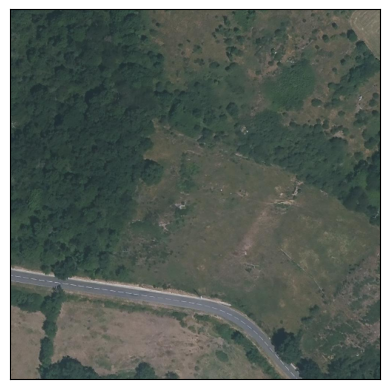

In [ ]:
model = load_model('/content/drive/MyDrive/DataScientest/Keras/classification_model_20231209.keras')
show_classification(model, df_decoupe, 11)


41 bâtiment(s)
probabilité de présence de bâtiment 100.0%


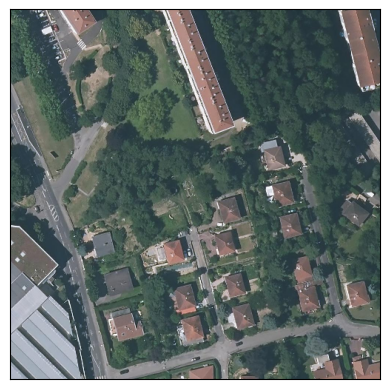

In [ ]:
show_classification(model, df_decoupe, 6901)


## Evaluation de la précision

On teste plusieurs seuils de classification : pour chaque seuil S, on classe comme positif (présence d'un bâtiment) si le résultat de la fonction sigmoid appliqué à la sortie du modèle est supérieure à S (S étant compris entre 0 et 1).

On en déduit ensuite l'accuracy par phase, afin de voir comment elle évolue en fonction du seuil de classification des images.

In [ ]:
model = load_model('/content/drive/MyDrive/DataScientest/Keras/classification_model_20231209.keras')
saving_path = '/content/drive/MyDrive/DataScientest/Keras/pred_classification_model_20231209.csv'
df_model_results = get_model_results(model, df_train, df_test, train_generator, test_generator, batch_size, saving_path)
display(df_model_results.head())

calcul des prédictions sur les données d'entraînement


100%|██████████| 93/93 [02:32<00:00,  1.64s/it]


calcul des prédictions sur les données de validation


100%|██████████| 23/23 [00:34<00:00,  1.48s/it]


,target,prediction,phase
0,1.0,19.972233,train
1,1.0,56.183228,train
2,1.0,4.922765,train
3,1.0,3.581819,train
4,1.0,11.150962,train


In [ ]:
df_model_results = pd.read_csv('/content/drive/MyDrive/DataScientest/Keras/pred_classification_model_20231209.csv')
list_df_accuracy = []

for seuil in range(1, 100):
  df_model_results_calcul = df_model_results.copy()
  df_model_results_calcul['prediction'] = (sigmoid(df_model_results_calcul['prediction']) > seuil/100)*1
  df_model_results_calcul['accuracy'] = df_model_results_calcul['prediction'] == df_model_results_calcul['target']
  list_df_accuracy.append(df_model_results_calcul.groupby('phase').agg({'accuracy' : 'mean'}).assign(seuil = seuil/100))

df_accuracy = pd.concat(list_df_accuracy).reset_index()

fig_classification = px.line(
    df_accuracy,
    x = 'seuil',
    y = 'accuracy',
    color = 'phase')
fig_classification.update_layout(
    title = 'accuracy modèle classification (06.12)<br>en fonction du seuil de classification',
    xaxis_title = 'seuil de classification',
    yaxis_title = 'accuracy',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_classification.write_html('/content/drive/MyDrive/DataScientest/Keras/acc_classification_model_20231206.html')
fig_classification.show()

# Transfer learning - NON FINI

L'idée est de réutiliser le modèle NN entraîné en enlevant uniquement la couche de sortie, et de coupler celle-ci à un modèle "classique" non-NN.

On s'appuie sur la notion de pipeline Scikit Learn, en définissant une classe spécifique de Transformer, qui agira comme premier élément du pipeline.

On définit ensuite un gridSearch pour trouver le paramétrage optimal du modèle non-NN

## Assemblage NN+RFR

In [ ]:
resolution = (500, 500)
batch_size = 64

In [ ]:
class ApplyNN(BaseEstimator, TransformerMixin):
    def __init__(self, NN_model, data_generator, features_df_col, images_path, batch_size, resolution):
      self.NN_model = NN_model
      self.data_generator = data_generator
      self.features_df_col = features_df_col
      self.target_df_col = target_df_col
      self.images_path = images_path
      self.batch_size = batch_size
      self.resolution = resolution
    def fit(self, X, y = None):
      self.data_flow = self.data_generator.flow_from_dataframe(
          dataframe = X,
          directory = self.images_path,
          x_col = self.features_df_col,
          class_mode = 'raw',
          target_size = self.resolution,
          batch_size = self.batch_size)
      return self
    def transform(self, X, y = None):
        n_batchs = X.shape[0] // self.batch_size
        pred_NN = []
        for i in tqdm.tqdm(range(batch_size)):
          images, _ = self.data_flow.next()
          pred_NN += self.NN_model.predict(images, verbose=0).tolist()
        return pred_NN, y


In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/DataScientest/Keras/first_model_20231129.keras')
intermediate_NN_model = keras.models.Model(inputs=model.input, outputs=model.layers[5].output)
model_RFR = RandomForestRegressor(n_estimators = 10)

NN_lasso_pipe = Pipeline(steps = [
    ('NN_model', ApplyNN(
        intermediate_NN_model,
        ImageDataGenerator(rescale = 1./255),
        'fichier_img',
        images_path,
        batch_size,
        resolution)),
     ('model', model_RFR)])

In [ ]:
df_decoupe_extract = df_decoupe.iloc[np.random.choice(range(df_decoupe.shape[0]), 1000, replace = False)]
params = {'model__n_estimators' : [10,20,40,60,80]}
grid_search_NN_lasso = GridSearchCV(
    NN_lasso_pipe,
    param_grid = params,
    cv = 5,
    verbose = 3,
    scoring = 'neg_mean_absolute_error')
grid_search_NN_lasso.fit(df_decoupe_extract, df_decoupe_extract['formes'])

# Semantic segmentation

Le but du modèle est de prédire prédire pour chaque pixel si c’est un bâtiment ou non.
Au préalable, il faut donc modifier la classe initiale de chaque pixel des masques :

+ 1 si le pixel correspond à une forme, ou au contour de la forme (*nota : classe initiale à 2 pour le contour*)
+ 0 sinon



## Configuration et pré-traitement des données

Il est également nécessaire de limiter la résolution des images : avec 500x500, l'entraînement plante par manque de mémoire, on prend donc une taille plus réduite

Pour les données target (masque), on ne garde qu'un canal (parmi les 3 canaux R, G, B) étant donné que les valeurs sont identiques


In [ ]:
resolution = (256, 256)
batch_size = 64

In [ ]:
df_train, df_test = train_test_split(df_decoupe, test_size=0.2, random_state = 77)

input_img_paths_train = [os.path.join(images_path, file_name) for file_name in df_train['fichier_img'].values]
mask_img_paths_train = [os.path.join(images_path, file_name) for file_name in df_train['fichier_mask'].values]
input_img_paths_test = [os.path.join(images_path, file_name) for file_name in df_test['fichier_img'].values]
mask_img_paths_test = [os.path.join(images_path, file_name) for file_name in df_test['fichier_mask'].values]

train_dataset = get_img_dataset(
    batch_size,
    resolution,
    input_img_paths_train,
    mask_img_paths_train,
    binary_mask = True)
test_dataset = get_img_dataset(
    batch_size,
    resolution,
    input_img_paths_test,
    mask_img_paths_test,
    binary_mask = True)

In [ ]:
iterator = test_dataset.as_numpy_iterator()
item = iterator.next()
np.unique(item[0])

array([  7.5046387,   8.412598 ,   9.888184 , ..., 254.99438  ,
       254.99487  , 255.       ], dtype=float32)

In [ ]:
iterator = test_dataset.as_numpy_iterator()
item = iterator.next()
np.unique(item[1])

array([0, 1], dtype=int32)

## Création du modèle et entraînement

On utilise un modèle "en U", avec un enchaînement de convolutions, suivi d'un enchaînement de convolution transpose (inverse de la convolution)

Le modèle est créé sans fonction d'activation dans la couche output ("logits" uniquement), afin de pouvoir tester plusieurs seuils de classification ensuite, en raison du caractère binaire du masque

In [ ]:
model = Sequential()
model.add(Rescaling(scale = 1./255,
                    input_shape = (resolution + (3,))))
model.add(Conv2D(filters = 64,
                 kernel_size = (3, 3),
                 strides = 2,
                 activation = 'relu',
                 padding = 'same',
                 input_shape = (resolution + (3,))))
model.add(Conv2D(filters = 64,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2D(filters = 128,
                 strides = 2,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2D(filters = 128,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2D(filters = 256,
                 strides = 2,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2D(filters = 256,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2DTranspose(filters = 256,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 256,
                          strides = 2,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 128,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 128,
                          strides = 2,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 64,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 64,
                          strides = 2,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2D(filters = 1,
                 kernel_size = (3, 3),
                 activation = None,
                 padding = 'same'))

model.compile(optimizer = Adam(1e-4),
              loss = keras.losses.BinaryCrossentropy(from_logits = True),
              metrics = keras.metrics.BinaryCrossentropy(from_logits = True, name = 'accuracy'))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 128, 128, 64)      1792      
                                                                 
 conv2d_8 (Conv2D)           (None, 128, 128, 64)      36928     
                                                                 
 conv2d_9 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 conv2d_10 (Conv2D)          (None, 64, 64, 128)       147584    
                                                                 
 conv2d_11 (Conv2D)          (None, 32, 32, 256)       295168    
                                                                 
 conv2d_12 (Conv2D)          (None, 32, 32, 256)      

In [ ]:
today_date = date.today().strftime('%Y%m%d')

callbacks = [ModelCheckpoint(
    filepath = '/content/drive/MyDrive/DataScientest/Keras/sm_segmentation_model_' + today_date,
    save_best_only = True)]

history = model.fit(train_dataset,
                    callbacks = callbacks,
                    epochs = 50,
                    batch_size = batch_size,
                    validation_data = test_dataset)

model.save('/content/drive/MyDrive/DataScientest/Keras/sm_segmentation_model_' + today_date + '.keras')
np.save('/content/drive/MyDrive/DataScientest/Keras/history_sm_segmentation_model_' + today_date + '.npy', history.history)

Epoch 1/50
94/94 [==============================] - 152s 2s/step - loss: 0.4445 - accuracy: 0.4445 - val_loss: 0.3182 - val_accuracy: 0.3182
Epoch 2/50
94/94 [==============================] - 120s 1s/step - loss: 0.2267 - accuracy: 0.2267 - val_loss: 0.2076 - val_accuracy: 0.2076
Epoch 3/50
94/94 [==============================] - 115s 1s/step - loss: 0.1969 - accuracy: 0.1969 - val_loss: 0.1829 - val_accuracy: 0.1829
Epoch 4/50
94/94 [==============================] - 135s 1s/step - loss: 0.1742 - accuracy: 0.1742 - val_loss: 0.1601 - val_accuracy: 0.1601
Epoch 5/50
94/94 [==============================] - 109s 1s/step - loss: 0.1615 - accuracy: 0.1615 - val_loss: 0.1517 - val_accuracy: 0.1517
Epoch 6/50
94/94 [==============================] - 114s 1s/step - loss: 0.1533 - accuracy: 0.1533 - val_loss: 0.1445 - val_accuracy: 0.1445
Epoch 7/50
94/94 [==============================] - 109s 1s/step - loss: 0.1474 - accuracy: 0.1474 - val_loss: 0.1381 - val_accuracy: 0.1381
Epoch 8/50
94

In [ ]:
history_data = np.load('/content/drive/MyDrive/DataScientest/Keras/history_sm_segmentation_model_20231209.npy', allow_pickle='TRUE').item()
df_history_data = pd.DataFrame({
    'epochs' : [*range(1, len(history_data['loss']) + 1)]*2,
    'loss' : history_data['accuracy'] + history_data['val_loss'],
    'phase' : ['train'] * len(history_data['loss']) + ['validation'] * len(history_data['loss'])})
fig_mae = px.line(
    df_history_data,
    x = 'epochs',
    y = 'loss',
    color = 'phase')
fig_mae.update_layout(
    title = 'loss test/val modèle semantic segmentation (09.12)',
    xaxis_title = 'epoch',
    yaxis_title = 'loss',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_mae.write_html('/content/drive/MyDrive/DataScientest/Keras/accuracy_sm_segmentation_model_20231209.html')
fig_mae.show()

## Résultats

In [ ]:
model = load_model('/content/drive/MyDrive/DataScientest/Keras/sm_segmentation_model_20231209.keras')


11 bâtiment(s), regroupés en 10 contours
10 contours(s) prédit(s)


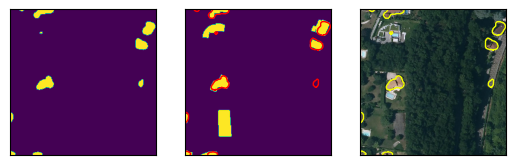

In [ ]:
i_image = 5698
show_sm_segmentation_results(model, i_image, df_decoupe)

34 bâtiment(s), regroupés en 15 contours
12 contours(s) prédit(s)


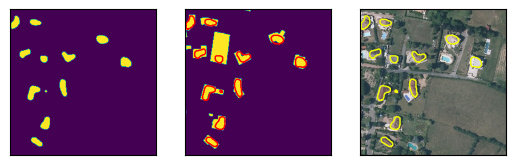

In [ ]:
i_image = 3598
show_sm_segmentation_results(model, i_image, df_decoupe, seuil = 0.9)

1 bâtiment(s), regroupés en 1 contours
0 contours(s) prédit(s)


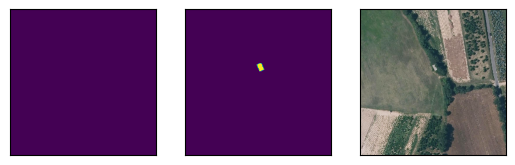

In [ ]:
i_image = 5099
show_sm_segmentation_results(model, i_image, df_decoupe)

## Evaluation de la précision

On calcule les performances du modèle, en testant plusieurs seuils de classification : pour chaque seuil S, on classe un pixel comme positif (présence d'un bâtiment) si le résultat de la fonction sigmoid appliqué à la sortie du modèl est supérieure à S (S étant compris entre 0 et 1).

On compare ensuite :

+ le nombre de contours de formes initial, c'est-à-dire en ne tenant pas compte des limites des bâtiments
+ le nombre de contours déterminés à partir des pixels classifiés "positifs" en fonction du seuil

On en déduit ensuite la mae par phase, afin de voir comment elle évolue en fonction du seuil de classification des pixels.

In [ ]:
list_nb_contours_target = []
for df in (df_train, df_test):
  for i_image in range(df.shape[0]):
    val_target = img_to_array(load_img(
        images_path + '/' + df_decoupe['fichier_mask'].values[i_image],
        target_size = resolution))[:,:,0].reshape(resolution + (1,))
    val_target = np.where(val_target > 0, 1, 0)
    list_nb_contours_target.append(len(ski.measure.find_contours(val_target.reshape(resolution))))

train_results = model.predict(train_dataset)
test_results = model.predict(test_dataset)

list_df_mae = []
list_phases = ['train']*df_train.shape[0] + ['validation']*df_test.shape[0]

for seuil in range(1, 100):
  list_nb_contours_pred = []
  for result in (train_results, test_results):
    for i in range(result.shape[0]):
      mask = (sigmoid(result[i]) > seuil/100)*1
      list_nb_contours_pred.append(len(ski.measure.find_contours(mask.reshape(resolution))))
  df_model_results = pd.DataFrame({
      'target': list_nb_contours_target,
      'prediction': list_nb_contours_pred,
      'phase': list_phases})
  df_model_results['mae'] = np.abs(df_model_results['target'] - df_model_results['prediction'])
  list_df_mae.append(df_model_results.groupby('phase').agg({'mae' : 'mean'}).assign(seuil = seuil/100))

df_mae = pd.concat(list_df_mae).reset_index()

df_mae.to_csv('/content/drive/MyDrive/DataScientest/Keras/mae_sm_segmentation_model_20231209.csv', index = False)

24/24 [==============================] - 42s 2s/step


In [ ]:
df_mae = pd.read_csv('/content/drive/MyDrive/DataScientest/Keras/mae_sm_segmentation_model_20231209.csv')
fig_classification = px.line(
    df_mae,
    x = 'seuil',
    y = 'mae',
    color = 'phase')
fig_classification.update_layout(
    title = 'mae modèle semantic segmentation classification (09.12)<br>en fonction du seuil de classification des pixels',
    xaxis_title = 'seuil de classification',
    yaxis_title = 'mae',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_classification.write_html('/content/drive/MyDrive/DataScientest/Keras/mae_sm_segmentation_model_20231209.html')
fig_classification.show()

# Instance segmentation

Le but du modèle est de prédire la classe de chaque pixel, c'est-à-dire de reconstituer le masque, dont les valeurs de pixel sont :

+ 1 si le pixel correspond à une forme,
+ 2 pour le contour de la forme,
+ 0 sinon

On considère donc que l'on fait de l'instance segmentation dans la mesure où la prédiction permet en théorie de distinguer chaque instance de bâtiment



## Configuration et pré-traitement des données

*Mêmes principes que pour la semantic segmentation, en gardant cette fois les classes de départ*

In [ ]:
resolution = (256, 256)
batch_size = 64

In [ ]:
df_train, df_test = train_test_split(df_decoupe, test_size=0.2, random_state = 77)

input_img_paths_train = [os.path.join(images_path, file_name) for file_name in df_train['fichier_img'].values]
mask_img_paths_train = [os.path.join(images_path, file_name) for file_name in df_train['fichier_mask'].values]
input_img_paths_test = [os.path.join(images_path, file_name) for file_name in df_test['fichier_img'].values]
mask_img_paths_test = [os.path.join(images_path, file_name) for file_name in df_test['fichier_mask'].values]

train_dataset = get_img_dataset(
    batch_size,
    resolution,
    input_img_paths_train,
    mask_img_paths_train)
test_dataset = get_img_dataset(
    batch_size,
    resolution,
    input_img_paths_test,
    mask_img_paths_test)

In [ ]:
# ancienne méthode de génération des images
images_data = np.zeros((nb_train + nb_validation,) + resolution + (3,), dtype = 'float32')
target_data = np.zeros((nb_train + nb_validation,) + resolution + (1,), dtype = 'uint8')
images_files = df_decoupe['fichier_img'].values
mask_files = df_decoupe['fichier_mask'].values
random.Random(1337).shuffle(images_files)
random.Random(1337).shuffle(mask_files)
images_files = images_files[:nb_train + nb_validation]
mask_files = mask_files[:nb_train + nb_validation]
for i in tqdm.tqdm(range(nb_train + nb_validation)):
  images_data[i] = img_to_array(load_img(
      images_path + '/' + images_files[i],
      target_size = resolution))
  target_data[i] = img_to_array(load_img(
      images_path + '/' + mask_files[i],
      # on ne garde qu'un des canaux R, G, B de l'image masque
      target_size = resolution))[:,:,0].reshape(resolution + (1,))

train_images_data = images_data[:-nb_validation]
train_target_data = target_data[:-nb_validation]
val_images_data = images_data[-nb_validation:]
val_target_data = target_data[-nb_validation:]

## Création du modèle et entraînement

*Mêmes principes que pour la semantic segmentation, sauf que l'on crée un softmax avec 3 classes en sortie*

In [ ]:
model = Sequential()
model.add(Rescaling(scale = 1./255,
                    input_shape = (resolution + (3,))))
model.add(Conv2D(filters = 64,
                 kernel_size = (3, 3),
                 strides = 2,
                 activation = 'relu',
                 padding = 'same',
                 input_shape = (resolution + (3,))))
model.add(Conv2D(filters = 64,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2D(filters = 128,
                 strides = 2,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2D(filters = 128,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2D(filters = 256,
                 strides = 2,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2D(filters = 256,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2DTranspose(filters = 256,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 256,
                          strides = 2,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 128,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 128,
                          strides = 2,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 64,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 64,
                          strides = 2,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2D(filters = 3,
                 kernel_size = (3, 3),
                 activation = 'softmax',
                 padding = 'same'))

model.compile(optimizer = 'rmsprop',
              loss = 'sparse_categorical_crossentropy',
              metrics = [keras.metrics.SparseCategoricalAccuracy(),
                         keras.metrics.MeanIoU(num_classes = 3, sparse_y_true = False, sparse_y_pred = False)])
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_7 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_49 (Conv2D)          (None, 128, 128, 64)      1792      
                                                                 
 conv2d_50 (Conv2D)          (None, 128, 128, 64)      36928     
                                                                 
 conv2d_51 (Conv2D)          (None, 64, 64, 128)       73856     
                                                                 
 conv2d_52 (Conv2D)          (None, 64, 64, 128)       147584    
                                                                 
 conv2d_53 (Conv2D)          (None, 32, 32, 256)       295168    
                                                                 
 conv2d_54 (Conv2D)          (None, 32, 32, 256)      

In [ ]:
today_date = date.today().strftime('%Y%m%d')

callbacks = [ModelCheckpoint(
    filepath = '/content/drive/MyDrive/DataScientest/Keras/segmentation_model_' + today_date,
    save_best_only = True)]

history = model.fit(train_dataset,
                    callbacks = callbacks,
                    epochs = 50,
                    batch_size = batch_size,
                    validation_data = test_dataset)

model.save('/content/drive/MyDrive/DataScientest/Keras/segmentation_model_' + today_date + '.keras')
np.save('/content/drive/MyDrive/DataScientest/Keras/history_segmentation_model_' + today_date + '.npy', history.history)

Epoch 1/50
94/94 [==============================] - 21s 202ms/step - loss: 0.4430 - sparse_categorical_accuracy: 0.8999 - mean_io_u_6: 0.3311 - val_loss: 0.3729 - val_sparse_categorical_accuracy: 0.9072 - val_mean_io_u_6: 1.0000
Epoch 2/50
94/94 [==============================] - 16s 172ms/step - loss: 0.3720 - sparse_categorical_accuracy: 0.9054 - mean_io_u_6: 1.0000 - val_loss: 0.5050 - val_sparse_categorical_accuracy: 0.9072 - val_mean_io_u_6: 1.0000
Epoch 3/50
94/94 [==============================] - 18s 190ms/step - loss: 0.3303 - sparse_categorical_accuracy: 0.9054 - mean_io_u_6: 1.0000 - val_loss: 0.2885 - val_sparse_categorical_accuracy: 0.9072 - val_mean_io_u_6: 1.0000
Epoch 4/50
94/94 [==============================] - 16s 172ms/step - loss: 0.3023 - sparse_categorical_accuracy: 0.9054 - mean_io_u_6: 1.0000 - val_loss: 0.3639 - val_sparse_categorical_accuracy: 0.9072 - val_mean_io_u_6: 1.0000
Epoch 5/50
94/94 [==============================] - 16s 172ms/step - loss: 0.2922 - 

In [ ]:
history_data = np.load('/content/drive/MyDrive/DataScientest/Keras/history_segmentation_model_20231211.npy', allow_pickle='TRUE').item()
df_history_data = pd.DataFrame({
    'epochs' : [*range(1, len(history_data['sparse_categorical_accuracy']) + 1)]*2,
    'sparse_categorical_accuracy' : history_data['sparse_categorical_accuracy'] + history_data['val_sparse_categorical_accuracy'],
    'iou' : history_data['mean_io_u_6'] + history_data['val_mean_io_u_6'],
    'phase' : ['train'] * len(history_data['sparse_categorical_accuracy']) + ['validation'] * len(history_data['val_sparse_categorical_accuracy'])})
fig_acc = px.line(
    df_history_data,
    x = 'epochs',
    y = 'sparse_categorical_accuracy',
    color = 'phase')
fig_acc.update_layout(
    title = 'sparse_categorical_accuracy test/val<br>modèle instance segmentation (11.12)',
    xaxis_title = 'epoch',
    yaxis_title = 'sparse_categorical_accuracy',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_acc.write_html('/content/drive/MyDrive/DataScientest/Keras/acc_segmentation_model_20231211.html')
fig_acc.show()

In [ ]:
fig_iou = px.line(
    df_history_data,
    x = 'epochs',
    y = 'iou',
    color = 'phase')
fig_iou.update_layout(
    title = 'iou test/val<br>modèle instance segmentation (11.12)',
    xaxis_title = 'epoch',
    yaxis_title = 'iou',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_iou.write_html('/content/drive/MyDrive/DataScientest/Keras/iou_segmentation_model_20231211.html')
fig_iou.show()

## Résultats

In [ ]:
model = load_model('/content/drive/MyDrive/DataScientest/Keras/segmentation_model_20231211.keras')

0 forme(s) détectée(s) pour 0 forme(s) présente(s)


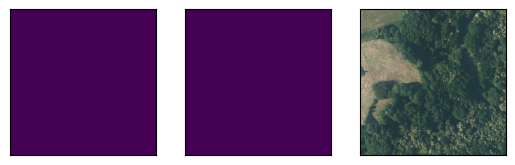

In [ ]:
i_image = 2000
show_segmentation_results(model, i_image, df_decoupe)

10 forme(s) détectée(s) pour 15 forme(s) présente(s)


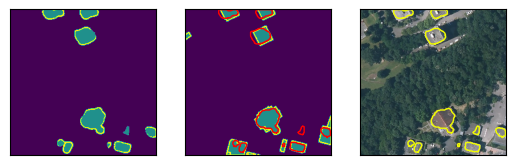

In [ ]:
i_image = 6730
show_segmentation_results(model, i_image, df_decoupe)

## Calcul du nombre de formes

On recalcule le nombre de formes à partir du résultat de la segmentation : on compte le nombre de formes comme le nombre de contours trouvés par le modèle

Le calcul est réalisé sur 2000 images tirées au hasard

In [ ]:
model = load_model('/content/drive/MyDrive/DataScientest/Keras/segmentation_model_20231211.keras')
nb_pred = 2000

images_files = df_decoupe['fichier_img'].values
mask_files = df_decoupe['fichier_mask'].values
target_forms = df_decoupe['formes'].values
random.Random(1337).shuffle(images_files)
random.Random(1337).shuffle(mask_files)
random.Random(1337).shuffle(target_forms)
images_files = images_files[:nb_pred]
mask_files = mask_files[:nb_pred]
target_forms = target_forms[:nb_pred]
pred_forms = []
for i in tqdm.tqdm(range(nb_pred)):
  image_data = img_to_array(load_img(
      images_path + '/' + images_files[i],
      target_size = resolution))
  mask = model.predict(np.expand_dims(image_data, 0), verbose = 0)[0]
  # même opération que pour l'affichage de la prédiction, sauf que l'on ne garde que
  # le nombre de contours trouvés
  mask = np.argmax(mask, axis = -1)
  mask_contours = ski.measure.find_contours(image = mask == 1)
  pred_forms.append(len(mask_contours))


100%|██████████| 2000/2000 [02:04<00:00, 16.05it/s]


In [ ]:
mae_pred = mean_absolute_error(target_forms, pred_forms)
fig_pred = px.scatter(
    x = target_forms,
    y = pred_forms)
fig_pred.update_layout(
    title = 'prédictions du nombre de formes par le modèle<br>d\'instance segmentation (11.12)<br>mae: {}'.format(round(mae_pred, 2)),
    plot_bgcolor = 'white',
    xaxis=dict(title='valeur'),
    yaxis=dict(title='prédiction'),
    height = 600,
    width = 600)
fig_pred.write_html('/content/drive/MyDrive/DataScientest/Keras/pred_segmentation_model_20231211.html')
fig_pred.show()

# Instance segmentation ciblée

Le modèle est spécifiquement entraîné sur des images contenant au moins un bâtiment

In [ ]:
df_train, df_test = train_test_split(df_decoupe[df_decoupe['formes'] > 0], test_size=0.2, random_state = 77)

input_img_paths_train = [os.path.join(images_path, file_name) for file_name in df_train['fichier_img'].values]
mask_img_paths_train = [os.path.join(images_path, file_name) for file_name in df_train['fichier_mask'].values]
input_img_paths_test = [os.path.join(images_path, file_name) for file_name in df_test['fichier_img'].values]
mask_img_paths_test = [os.path.join(images_path, file_name) for file_name in df_test['fichier_mask'].values]

train_dataset = get_img_dataset(
    batch_size,
    resolution,
    input_img_paths_train,
    mask_img_paths_train)
test_dataset = get_img_dataset(
    batch_size,
    resolution,
    input_img_paths_test,
    mask_img_paths_test)

In [ ]:
model = Sequential()
model.add(Rescaling(scale = 1./255,
                    input_shape = (resolution + (3,))))
model.add(Conv2D(filters = 64,
                 kernel_size = (3, 3),
                 strides = 2,
                 activation = 'relu',
                 padding = 'same',
                 input_shape = (resolution + (3,))))
model.add(Conv2D(filters = 64,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2D(filters = 128,
                 strides = 2,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2D(filters = 128,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2D(filters = 256,
                 strides = 2,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2D(filters = 256,
                 kernel_size = (3, 3),
                 activation = 'relu',
                 padding = 'same'))
model.add(Conv2DTranspose(filters = 256,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 256,
                          strides = 2,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 128,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 128,
                          strides = 2,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 64,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2DTranspose(filters = 64,
                          strides = 2,
                          kernel_size = (3, 3),
                          activation = 'relu',
                          padding = 'same'))
model.add(Conv2D(filters = 3,
                 kernel_size = (3, 3),
                 activation = 'softmax',
                 padding = 'same'))

model.compile(optimizer = 'rmsprop',
              loss = 'sparse_categorical_crossentropy',
              metrics = [keras.metrics.SparseCategoricalAccuracy(),
                         keras.metrics.MeanIoU(num_classes = 3, sparse_y_true = False, sparse_y_pred = False)])
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_8 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_56 (Conv2D)          (None, 128, 128, 64)      1792      
                                                                 
 conv2d_57 (Conv2D)          (None, 128, 128, 64)      36928     
                                                                 
 conv2d_58 (Conv2D)          (None, 64, 64, 128)       73856     
                                                                 
 conv2d_59 (Conv2D)          (None, 64, 64, 128)       147584    
                                                                 
 conv2d_60 (Conv2D)          (None, 32, 32, 256)       295168    
                                                                 
 conv2d_61 (Conv2D)          (None, 32, 32, 256)      

In [ ]:
today_date = date.today().strftime('%Y%m%d')

callbacks = [ModelCheckpoint(
    filepath = '/content/drive/MyDrive/DataScientest/Keras/segmentation_model_cible_' + today_date,
    save_best_only = True)]

history = model.fit(train_dataset,
                    callbacks = callbacks,
                    epochs = 50,
                    batch_size = batch_size,
                    validation_data = test_dataset)

model.save('/content/drive/MyDrive/DataScientest/Keras/segmentation_model_cible_' + today_date + '.keras')
np.save('/content/drive/MyDrive/DataScientest/Keras/history_segmentation_model_cible_' + today_date + '.npy', history.history)

Epoch 1/50
72/72 [==============================] - 18s 209ms/step - loss: 0.7156 - sparse_categorical_accuracy: 0.8689 - mean_io_u_7: 0.3296 - val_loss: 0.4751 - val_sparse_categorical_accuracy: 0.8725 - val_mean_io_u_7: 1.0000
Epoch 2/50
72/72 [==============================] - 15s 205ms/step - loss: 0.4578 - sparse_categorical_accuracy: 0.8784 - mean_io_u_7: 1.0000 - val_loss: 0.4677 - val_sparse_categorical_accuracy: 0.8725 - val_mean_io_u_7: 1.0000
Epoch 3/50
72/72 [==============================] - 15s 204ms/step - loss: 0.4134 - sparse_categorical_accuracy: 0.8784 - mean_io_u_7: 1.0000 - val_loss: 0.4135 - val_sparse_categorical_accuracy: 0.8725 - val_mean_io_u_7: 1.0000
Epoch 4/50
72/72 [==============================] - 15s 201ms/step - loss: 0.3842 - sparse_categorical_accuracy: 0.8788 - mean_io_u_7: 0.4990 - val_loss: 0.3876 - val_sparse_categorical_accuracy: 0.8731 - val_mean_io_u_7: 0.4996
Epoch 5/50
72/72 [==============================] - 15s 207ms/step - loss: 0.3745 - 

In [ ]:
history_data = np.load('/content/drive/MyDrive/DataScientest/Keras/history_segmentation_model_cible_20231211.npy', allow_pickle='TRUE').item()
df_history_data = pd.DataFrame({
    'epochs' : [*range(1, len(history_data['mean_io_u_7']) + 1)]*2,
    'iou' : history_data['mean_io_u_7'] + history_data['val_mean_io_u_7'],
    'phase' : ['train'] * len(history_data['mean_io_u_7']) + ['validation'] * len(history_data['val_mean_io_u_7'])})
fig_mae = px.line(
    df_history_data,
    x = 'epochs',
    y = 'iou',
    color = 'phase')
fig_mae.update_layout(
    title = 'iou test/val modèle<br>instance segmentation ciblé (11.12)',
    xaxis_title = 'epoch',
    yaxis_title = 'iou',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_mae.write_html('/content/drive/MyDrive/DataScientest/Keras/iou_segmentation_model_cible_20231211.html')
fig_mae.show()

Comparaison entre modèle ciblé et non ciblé

In [ ]:
model = load_model('/content/drive/MyDrive/DataScientest/Keras/segmentation_model_20231211.keras')
model_cible = load_model('/content/drive/MyDrive/DataScientest/Keras/segmentation_model_cible_20231211.keras')

10 forme(s) détectée(s) pour 15 forme(s) présente(s)


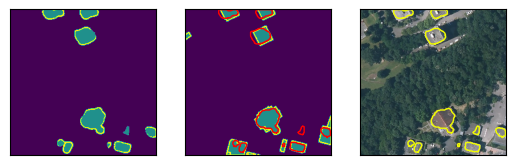

In [ ]:
i_image = 6730
show_segmentation_results(model, i_image, df_decoupe)

9 forme(s) détectée(s) pour 15 forme(s) présente(s)


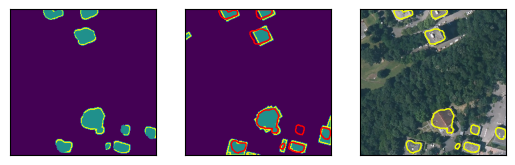

In [ ]:
i_image = 6730
show_segmentation_results(model_cible, i_image, df_decoupe)

# Instance segmentation with Unet

Application du [tutoriel Keras](https://keras.io/examples/vision/oxford_pets_image_segmentation/)

*Même principe que les modèles de semantic segmentation précédents*

## Configuration et pré-traitement des données

In [ ]:
resolution = (256, 256)
batch_size = 64

In [ ]:
df_train, df_test = train_test_split(df_decoupe, test_size=0.2, random_state = 77)

input_img_paths_train = [os.path.join(images_path, file_name) for file_name in df_train['fichier_img'].values]
mask_img_paths_train = [os.path.join(images_path, file_name) for file_name in df_train['fichier_mask'].values]
input_img_paths_test = [os.path.join(images_path, file_name) for file_name in df_test['fichier_img'].values]
mask_img_paths_test = [os.path.join(images_path, file_name) for file_name in df_test['fichier_mask'].values]

train_dataset = get_img_dataset(
    batch_size,
    resolution,
    input_img_paths_train,
    mask_img_paths_train)
test_dataset = get_img_dataset(
    batch_size,
    resolution,
    input_img_paths_test,
    mask_img_paths_test)

## Création du modèle et entraînement

In [ ]:
model = get_Unet_model(resolution, 3)
model.compile(
    optimizer = Adam(1e-4),
    loss = 'sparse_categorical_crossentropy',
    metrics = [keras.metrics.SparseCategoricalAccuracy(),
                         keras.metrics.MeanIoU(num_classes = 3, sparse_y_true = False, sparse_y_pred = False)])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_63 (Conv2D)          (None, 128, 128, 32)         896       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 128, 128, 32)         128       ['conv2d_63[0][0]']           
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 128, 128, 32)         0         ['batch_normalization[0][0

In [ ]:
today_date = date.today().strftime('%Y%m%d')

callbacks = [ModelCheckpoint(
    filepath = '/content/drive/MyDrive/DataScientest/Keras/Unet_model_' + today_date,
    save_best_only = True)]

history = model.fit(train_dataset,
                    callbacks = callbacks,
                    epochs = 50,
                    batch_size = batch_size,
                    validation_data = test_dataset)

model.save('/content/drive/MyDrive/DataScientest/Keras/Unet_model_' + today_date + '.keras')
np.save('/content/drive/MyDrive/DataScientest/Keras/history_Unet_model_' + today_date + '.npy', history.history)


In [ ]:
history_data = np.load('/content/drive/MyDrive/DataScientest/Keras/history_Unet_model_20231211.npy', allow_pickle='TRUE').item()
df_history_data = pd.DataFrame({
    'epochs' : [*range(1, len(history_data['sparse_categorical_accuracy']) + 1)]*2,
    'sparse_categorical_accuracy' : history_data['sparse_categorical_accuracy'] + history_data['val_sparse_categorical_accuracy'],
    'iou' : history_data['mean_io_u_8'] + history_data['val_mean_io_u_8'],
    'phase' : ['train'] * len(history_data['sparse_categorical_accuracy']) + ['validation'] * len(history_data['val_sparse_categorical_accuracy'])})
fig_acc = px.line(
    df_history_data,
    x = 'epochs',
    y = 'sparse_categorical_accuracy',
    color = 'phase')
fig_acc.update_layout(
    title = 'sparse_categorical_accuracy test/val<br>modèle Unet (11.12)',
    xaxis_title = 'epoch',
    yaxis_title = 'sparse_categorical_accuracy',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_acc.write_html('/content/drive/MyDrive/DataScientest/Keras/acc_Unet_model_.html')
fig_acc.show()

## Résultats

In [ ]:
model = load_model('/content/drive/MyDrive/DataScientest/Keras/Unet_model_20231211.keras')

13 forme(s) détectée(s) pour 15 forme(s) présente(s)


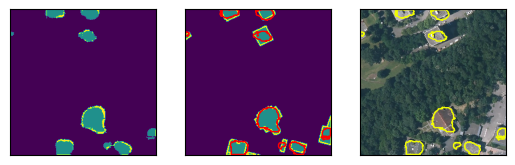

In [ ]:
i_image = 6730
show_segmentation_results(model, i_image, df_decoupe)

56 forme(s) détectée(s) pour 80 forme(s) présente(s)


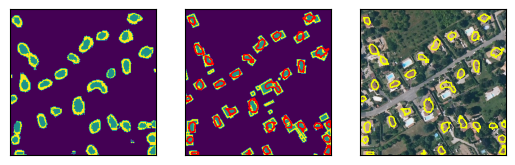

In [ ]:
i_image = 4730
show_segmentation_results(model, i_image, df_decoupe)

11 forme(s) détectée(s) pour 1 forme(s) présente(s)


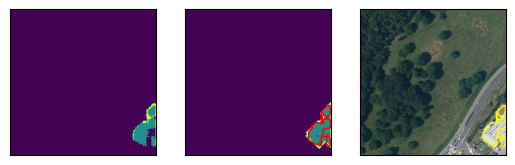

In [ ]:
i_image = 730
show_segmentation_results(model, i_image, df_decoupe)

101 forme(s) détectée(s) pour 84 forme(s) présente(s)


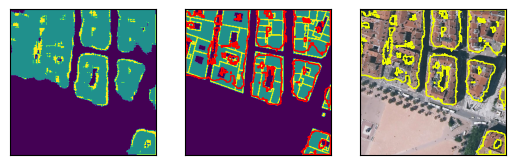

In [ ]:
i_image = 430
show_segmentation_results(model, i_image, df_decoupe)

# Semantic segmentation with Unet

*Utilisation du modèle précédent, mais avec 2 classes (cf. "semantic segmentation" plus haut)*

## Configuration et pré-traitement des données

In [ ]:
resolution = (512, 512)
batch_size = 16

In [ ]:
def read_image(image_path, mask = False, binary_mask = False):
  image = tf.io.read_file(image_path)
  if mask:
    image = tf.image.decode_png(image, channels = 1)
    if binary_mask:
      image = tf.where(tf.math.greater(image, 0), 1, 0)
    image.set_shape([None, None, 1])
    image = tf.image.resize(images = image, size = resolution)
  else:
    image = tf.image.decode_png(image, channels = 3)
    image.set_shape([None, None, 3])
    image = tf.image.resize(images = image, size = resolution)
  return image

def load_data(image_list, mask_list):
  image = read_image(image_list)
  mask = read_image(mask_list, mask = True, binary_mask = True)
  return image, mask

def data_generator(image_list, mask_list):
  dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
  dataset = (
    dataset
    .map(load_data, num_parallel_calls = tf.data.AUTOTUNE)
    .batch(batch_size, drop_remainder=True)
    .prefetch(tf.data.AUTOTUNE)
  )
  return dataset

In [ ]:
df_train, df_test = train_test_split(df_decoupe.sample(1200), test_size=0.2, random_state=77)

input_img_paths_train = [os.path.join(images_path, file_name) for file_name in df_train['fichier_img'].values]
mask_img_paths_train = [os.path.join(images_path, file_name) for file_name in df_train['fichier_mask'].values]
input_img_paths_test = [os.path.join(images_path, file_name) for file_name in df_test['fichier_img'].values]
mask_img_paths_test = [os.path.join(images_path, file_name) for file_name in df_test['fichier_mask'].values]

train_dataset = data_generator(input_img_paths_train, mask_img_paths_train)
val_dataset = data_generator(input_img_paths_test, mask_img_paths_test)

print('Train Dataset: ', train_dataset)
print('Validation Dataset: ', val_dataset)

Train Dataset:  <_PrefetchDataset element_spec=(TensorSpec(shape=(16, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(16, 512, 512, 1), dtype=tf.float32, name=None))>
Validation Dataset:  <_PrefetchDataset element_spec=(TensorSpec(shape=(16, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(16, 512, 512, 1), dtype=tf.float32, name=None))>


## Création du modèle et entraînement

In [ ]:
model = get_Unet_model(resolution, 2)
model.compile(
    optimizer = Adam(1e-4),
    loss = 'sparse_categorical_crossentropy',
    metrics = [keras.metrics.SparseCategoricalAccuracy()])
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv2d_36 (Conv2D)          (None, 256, 256, 32)         896       ['input_5[0][0]']             
                                                                                                  
 batch_normalization_60 (Ba  (None, 256, 256, 32)         128       ['conv2d_36[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_60 (Activation)  (None, 256, 256, 32)         0         ['batch_normalization_60

In [ ]:
today_date = date.today().strftime('%Y%m%d')

callbacks = [ModelCheckpoint(
    filepath = '/content/drive/MyDrive/DataScientest/Keras/Unet_model_binary_' + today_date,
    save_best_only = True)]

history = model.fit(train_dataset,
                    callbacks = callbacks,
                    epochs = 50,
                    batch_size = batch_size,
                    validation_data = test_dataset)

model.save('/content/drive/MyDrive/DataScientest/Keras/Unet_model_binary_' + today_date + '.keras')
np.save('/content/drive/MyDrive/DataScientest/Keras/history_Unet_model_binary_' + today_date + '.npy', history.history)


Epoch 1/50
60/60 [==============================] - 950s 16s/step - loss: 0.5563 - sparse_categorical_accuracy: 0.8863 - val_loss: 0.3633 - val_sparse_categorical_accuracy: 0.9060
Epoch 2/50
60/60 [==============================] - 927s 16s/step - loss: 0.2596 - sparse_categorical_accuracy: 0.9139 - val_loss: 0.6177 - val_sparse_categorical_accuracy: 0.9072
Epoch 3/50
60/60 [==============================] - 935s 16s/step - loss: 0.2133 - sparse_categorical_accuracy: 0.9224 - val_loss: 0.7728 - val_sparse_categorical_accuracy: 0.9072
Epoch 4/50
60/60 [==============================] - 931s 16s/step - loss: 0.1917 - sparse_categorical_accuracy: 0.9275 - val_loss: 0.8870 - val_sparse_categorical_accuracy: 0.9072
Epoch 5/50
60/60 [==============================] - 934s 16s/step - loss: 0.1785 - sparse_categorical_accuracy: 0.9312 - val_loss: 0.9278 - val_sparse_categorical_accuracy: 0.9072
Epoch 6/50
60/60 [==============================] - 923s 15s/step - loss: 0.1692 - sparse_categorica

## Résultats

In [ ]:
model = load_model('/content/drive/MyDrive/DataScientest/Keras/Unet_model_binary_20240106.keras')


17 forme(s) détectée(s) pour 3 forme(s) présente(s)


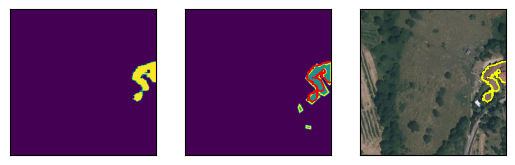

In [ ]:
i_image = 6
show_segmentation_results(model, i_image, df_decoupe)

## Statistiques

In [ ]:
SIZE = 512
RESOLUTION = (SIZE, SIZE)
NUM_CLASSES = 2
BINARY_MASK = True
BATCH_SIZE = 16
SEED = 77

In [ ]:
model = load_model('/content/drive/MyDrive/DataScientest/Keras/Unet_model_binary_20240106.keras')


In [ ]:
_, df_metrique = train_test_split(df_decoupe, test_size=0.2, random_state=SEED)
df_metrique = df_metrique.reset_index()


In [ ]:
compare_ligne(
    df_metrique, images_path + '/', 34,
    resolution = RESOLUTION, affichage = True, binaire = True,
    img_norm = False, img_centrage = None, img_BGR = False)

Numéro image =  34
Nombre de formes =  48
/content/data/decoupe_final/decoupe_final/69-2020_4_835000.0_0_6514000.0_48_data.jpg
/content/data/decoupe_final/decoupe_final/69-2020_4_835000.0_0_6514000.0_48_label.png
>> IoU =  0.6440982194141298
>> IoU (Keras) =  0.4352979
>> Accuracy =  0.94067
>> CrossEntropy =  0.12930492
>> Precision =  0.885904272829021
>> Recall =  0.7023514366991153


(0.6440982194141298,
 0.4352979,
 0.94067,
 0.12930492,
 0.885904272829021,
 0.7023514366991153)

In [ ]:
metriques = []
for i in tqdm.tqdm(range(df_metrique.shape[0])):
    metriques.append(list(compare_ligne(df_metrique, images_path + '/', i, resolution = RESOLUTION, affichage = False, binaire = True, img_norm = False, img_centrage = None, img_BGR = False)))

df_metrique['IoU'] = np.array(metriques)[:,0]
df_metrique['IoU_Keras'] = np.array(metriques)[:,1]
df_metrique['sca'] = np.array(metriques)[:,2]
df_metrique['scce'] = np.array(metriques)[:,3]
df_metrique.to_csv('/content/drive/MyDrive/DataScientest/Keras/Unet_binary_metriques_20240106.csv')

100%|██████████| 1500/1500 [08:06<00:00,  3.08it/s]



Moyenne IoU =  0.5628607047503368
Moyenne IoU Keras =  0.26020152850324907
Moyenne SCA =  0.9462597681681315
Moyenne SCCE =  0.15406375938370062


In [ ]:
df_metrique = pd.read_csv('/content/drive/MyDrive/DataScientest/Keras/Unet_binary_metriques_20240106.csv')
print('')
print("Moyenne IoU = ", df_metrique.IoU.mean())
print("Moyenne IoU Keras = ", df_metrique.IoU_Keras.mean())
print("Moyenne SCA = ", df_metrique.sca.mean())
print("Moyenne SCCE = ", df_metrique.scce.mean())

In [ ]:
fig = px.scatter(df_metrique, x='formes',y=['IoU', 'IoU_Keras','sca'], title="Analyse des métriques modèle Unet (06.01)")
fig.update_layout(
    xaxis=dict(title='Nbr formes',),
    yaxis=dict(title='Métrique',),
    legend=dict(title="Métrique")
)
fig.show()

In [ ]:
fig = px.histogram(df_metrique, x='IoU', nbins=40, title="Analyse IoU modèle Unet (06.01)")
fig.update_layout(
    xaxis=dict(title='IoU',),
    yaxis=dict(title='Count',))
fig.update_layout(bargap=0.1)
fig.show()

### Sensibilité au seuil de détection

Calcul de l'évolution des métriques en faisant varier le seuil de détection

In [ ]:
seuils = np.arange(0, 1.05, 0.05)
metriques = []
metriques_list = ['IoU', 'IoU_Keras', 'sca', 'scce', 'precision', 'recall', 'formes']
for seuil in tqdm.tqdm(seuils):
  for i in range(df_metrique.shape[0]):
    metriques.append(list(compare_ligne(
        df_metrique, images_path + '/', i,
        resolution = RESOLUTION, affichage = False, binaire = True,
        img_norm = False, img_centrage = None, img_BGR = False,
        seuil = seuil)) + [df_metrique['formes'].values[i]])
df_metriques_seuils = pd.DataFrame({
    'seuil': np.repeat(seuils, df_metrique.shape[0]*len(metriques_list)),
    'valeur': np.array(metriques).flatten(),
    'metrique': metriques_list*df_metrique.shape[0]*len(seuils)
})
df_metriques_seuils.to_csv('/content/drive/MyDrive/DataScientest/Keras/Unet_binary_metriques_seuil_20240106.csv')


100%|██████████| 21/21 [2:39:04<00:00, 454.49s/it]


In [ ]:
fig_seuils = px.line(
    df_metriques_seuils.groupby(['seuil', 'metrique']).agg({'valeur':'mean'}).reset_index().query("metrique in ['IoU', 'IoU_Keras']"),
    x = 'seuil',
    y = 'valeur',
    color = 'metrique')
fig_seuils.update_layout(
    title = 'IoU en fonction du seuil<br>modèle Unet (06.01)',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_seuils.show()

In [ ]:
fig_PR = px.line(
    df_metriques_seuils.groupby(['seuil', 'metrique']).agg({'valeur':'mean'}).reset_index().pivot(index = ['seuil'], columns = ['metrique'], values = 'valeur').reset_index(),
    x = 'recall',
    y = 'precision',
    hover_data=['seuil'])
fig_PR.update_layout(
    title = 'Courbe PR modèle Unet (06.01)',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_PR.show()

# Autres modèles

## Moez Unet

### Statistiques

In [ ]:
model = load_model('/content/drive/MyDrive/DataScientest/Keras/Moez-UNet07_res512_23_12_23.h5')


In [ ]:
RESOLUTION = (512, 512)
SEED = 77


In [ ]:
_, df_metrique = train_test_split(df_decoupe, test_size=0.2, random_state=SEED)
df_metrique = df_metrique.reset_index()

In [ ]:
compare_ligne(
    df_metrique, images_path + '/', 34,
    resolution = RESOLUTION, affichage = True, binaire = False,
    img_norm = True, img_centrage = None, img_BGR = False)

Numéro image =  34
Nombre de formes =  48
/content/data/decoupe_final/decoupe_final/69-2020_4_835000.0_0_6514000.0_48_data.jpg
/content/data/decoupe_final/decoupe_final/69-2020_4_835000.0_0_6514000.0_48_label.png
>> IoU =  0.7621531951723807
>> IoU (Keras) =  0.39902937
>> Accuracy =  0.9303436
>> CrossEntropy =  0.16847467
>> Precision =  0.9063357731015553
>> Recall =  0.8273090273246861


(0.7621531951723807,
 0.39902937,
 0.9303436,
 0.16847467,
 0.9063357731015553,
 0.8273090273246861)

In [ ]:
metriques = []
for i in tqdm.tqdm(range(df_metrique.shape[0])):
    metriques.append(list(compare_ligne(
        df_metrique, images_path + '/', i,
    resolution = RESOLUTION, affichage = False, binaire = True,
    img_norm = True, img_centrage = None, img_BGR = False)))

df_metrique['IoU'] = np.array(metriques)[:,0]
df_metrique['IoU_Keras'] = np.array(metriques)[:,1]
df_metrique['sca'] = np.array(metriques)[:,2]
df_metrique['scce'] = np.array(metriques)[:,3]
df_metrique.to_csv('/content/drive/MyDrive/DataScientest/Keras/Moez-UNet07_res512_23_12_23_metriques.csv')

100%|██████████| 1500/1500 [06:54<00:00,  3.62it/s]


In [ ]:
df_metrique = pd.read_csv('/content/drive/MyDrive/DataScientest/Keras/Moez-UNet07_res512_23_12_23_metriques.csv')
print('')
print("Moyenne IoU = ", df_metrique.IoU.mean())
print("Moyenne IoU Keras = ", df_metrique.IoU_Keras.mean())
print("Moyenne SCA = ", df_metrique.sca.mean())
print("Moyenne SCCE = ", df_metrique.scce.mean())


Moyenne IoU =  0.7046959518706929
Moyenne IoU Keras =  0.32007089448006204
Moyenne SCA =  0.9467338231404623
Moyenne SCCE =  0.17106567675529488


In [ ]:
fig = px.scatter(df_metrique, x='formes',y=['IoU', 'IoU_Keras','sca'], title="Analyse des métriques modèle UNet07_res512_23_12_23")
fig.update_layout(
    xaxis=dict(title='Nbr formes',),
    yaxis=dict(title='Métrique',),
    legend=dict(title="Métrique")
)
fig.show()

In [ ]:
fig = px.histogram(df_metrique, x='IoU', nbins=40, title="Analyse IoU modèle UNet07_res512_23_12_23")
fig.update_layout(
    xaxis=dict(title='IoU',),
    yaxis=dict(title='Count',))
fig.update_layout(bargap=0.1)
fig.show()

Calcul de l'évolution des métriques en faisant varier le seuil de détection

In [ ]:
seuils = np.arange(0, 1.05, 0.05)
metriques = []
metriques_list = ['IoU', 'IoU_Keras', 'sca', 'scce', 'precision', 'recall', 'TP', 'FP', 'FN' , 'formes']
for seuil in tqdm.tqdm(seuils):
  for i in range(df_metrique.shape[0]):
    metriques.append(list(compare_ligne(
        df_metrique, images_path + '/', i,
        resolution = RESOLUTION, affichage = False, binaire = True,
        img_norm = True, img_centrage = None, img_BGR = False,
        seuil = seuil)) + [df_metrique['formes'].values[i]])
df_metriques_seuils = pd.DataFrame({
    'i_img' : np.repeat([*range(df_metrique.shape[0])], len(metriques_list)).tolist()*len(seuils),
    'seuil': np.repeat(seuils, df_metrique.shape[0]*len(metriques_list)),
    'valeur': np.array(metriques).flatten(),
    'metrique': metriques_list*df_metrique.shape[0]*len(seuils)
})
df_metriques_seuils.to_csv('/content/drive/MyDrive/DataScientest/Keras/Moez-UNet07_res512_23_12_23_metriques_seuil_20240413.csv')


In [ ]:
fig_seuils = px.line(
    df_metriques_seuils.groupby(['seuil', 'metrique']).agg({'valeur':'mean'}).reset_index().query("metrique in ['IoU', 'IoU_Keras']"),
    x = 'seuil',
    y = 'valeur',
    color = 'metrique')
fig_seuils.update_layout(
    title = 'IoU en fonction du seuil<br>modèle UNet07_res512_23_12_23',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_seuils.show()

In [ ]:
fig_PR = px.line(
    df_metriques_seuils.groupby(['seuil', 'metrique']).agg({'valeur':'mean'}).reset_index().pivot(index = ['seuil'], columns = ['metrique'], values = 'valeur').reset_index(),
    x = 'recall',
    y = 'precision',
    hover_data=['seuil'])
fig_PR.update_layout(
    title = 'Courbe PR modèle UNet07_res512_23_12_23',
    plot_bgcolor='white',
    height = 600,
    width = 600)
fig_PR.show()

### Contours

Calcul des métriques évoluées de contours basées sur les formes

In [ ]:
def predict_Unet(file_name, model, seuil):
  image = tf.io.read_file(file_name)
  image = tf.image.decode_png(image, channels = 3)
  img_reduite = tf.image.resize(images = image, size = RESOLUTION)
  img_reduite /= 255

  prevision = tf.squeeze(model.predict(tf.expand_dims(img_reduite, 0), verbose=0))
  prev_mask = tf.where(tf.math.greater(tf.reduce_sum(prevision[:,:,1:], -1), seuil), 1, 0)
  return [prev_mask]

def calcul_ious_shapes(shapes_1_ext, shapes_2_ext):
  '''
  fonction qui calcule l'IoU des shapes_1_ext en cherchant à rapprocher les shapes_2_ext
  renvoie la liste des ious calculés
  '''
  ious = []
  rapprochements = []
  for i in range(len(shapes_1_ext)):
    shape_1 = shapely.Polygon(shapes_1_ext[i])
    unions = []
    unions.append(shape_1)
    intersections = []
    for j in range(len(shapes_2_ext)):
      shape_2 = shapely.Polygon(shapes_2_ext[j])
      if shape_2 is not None:
        if shape_1.intersects(shape_2):
          intersection = shape_1.intersection(shape_2)
          intersections.append(intersection)
          unions.append(shape_2)
    if len(intersections) > 0:
      intersection_area = shapely.area(gpd.GeoSeries(intersections, crs = 2154).unary_union)
    else:
      intersection_area = 0
    union_area = shapely.area(gpd.GeoSeries(unions, crs = 2154).unary_union)
    if union_area == 0:
      ious.append(0)
    else:
      ious.append(intersection_area/union_area)
    rapprochements.append(len(intersections))
  return ious, rapprochements

def affiche_contours(
    model, predict_function, df, chemin_images, index_l, resolution_model, resolution_target = (1000, 1000),
    seuil = None, seuil_iou = 0, gdf_shapes_ref = None, affichage = True,
    seuil_area = 10,
    tolerance_polygone = 0.1):
  '''
  fonction qui calcule les IoU des formes prédites par rapport à des formes de référence
  utilise les mêmes arguements que compare_ligne, avec en plus :
  - predict_function : fonction qui prend en argument le triplet (file_name, model, seuil) et qui renvoie une liste de prévisions du modèle "model" sous forme
  de masque numpy.array avec les dimensions correspondant au paramètre "resolution_model", pour le seuil de détection "seuil"
  - seuil_iou : les formes avec un IoU inférieur sont affichées en rouge
  - gdf_shapes_ref : fichier de shapefiles à utiliser pour la comparaison des formes prédites > par défaut, on compare par rapport aux formes du df_decoupe
  renvoie :
  - geoSeries avec les formes prédites, crs 2154, avec uniquement les contours
  - geoSeries avec les formes de réference, crs 2154, avec uniquement les contours, et en fusionnant les formes adjacentes
  - shapes_pred_ious
  - shapes_ref_ious
  '''
  file_name = chemin_images + df.loc[index_l,'fichier_img']
  raster_name = chemin_images + df.loc[index_l, 'fichier_raster']
  shape_name = chemin_images + df.loc[index_l, 'fichier_shapes']

  # Prévision
  prev_masks = predict_function(file_name, model, seuil)
  # Contours prédiction
  mask_contours = []
  for prev_mask in prev_masks:
    prev_mask_resized = tf.squeeze(tf_image.resize(images = np.expand_dims(prev_mask, -1), size = resolution_target, method = 'nearest'))
    mask_padded = np.pad(prev_mask_resized, ((1, 1),(1, 1)), mode = 'constant', constant_values = 0)
    mask_contours += ski.measure.find_contours(image = mask_padded == 1)

  # Shapes prédiction
  with rasterio.open(raster_name) as raster:
    # création du convertisseur pour passer des coordonnées en pixels
    raster_transform = raster.transform
    raster_transformer = rasterio.transform.AffineTransformer(raster_transform)
    shapes_xy = []
    shapes_predict = []
    # parcours de tous les contours prédits
    for contour in mask_contours:
      # on crée le polygone
      polygon = approximate_polygon(contour, tolerance = tolerance_polygone)
      # on tranforme en coordonnées
      xy_polygon = raster_transformer.xy(polygon[:,0], polygon[:,1])
      shapes_xy.append(xy_polygon)
      # on crée le polygone
      shapes_predict.append(shapely.Polygon(np.array(xy_polygon).transpose()))
  # on filtre les surface trop petites
  shapes_predict = [shape for shape in shapes_predict if shapely.area(shape) > seuil_area]
  # Ajout des trous dans les shapes prédiction
  shapes_predict_holes = []
  shapes_holes = []
  for shape_a in shapes_predict:
    if shape_a not in shapes_holes:
      shape_a_holes = []
      for shape_b in shapes_predict:
        if shape_a.contains_properly(shape_b):
          shape_a_holes.append(shape_b.exterior)
          shapes_holes.append(shape_b)
      if len(shape_a_holes) > 0:
        shapes_predict_holes.append(shapely.Polygon(shape_a.exterior, holes = shape_a_holes))
      else:
        shapes_predict_holes.append(shape_a)
  gdf_shapes_predict = gpd.GeoDataFrame(geometry = gpd.GeoSeries(shapes_predict_holes, crs=2154), crs=2154)
  # gdf_shapes_predict = gdf_shapes_predict[gdf_shapes_predict['geometry'].is_valid].reset_index()

  # Shapes référence
  if gdf_shapes_ref is None:
    gdf_shapes_ref = gpd.read_file(shape_name)
  # gdf_shapes_ref = gdf_shapes_ref[gdf_shapes_ref['geometry'].is_valid].reset_index()
  # /!\ on court-circuite le traitement pour éviter de supprimer des formes de référence
  '''
  # Regroupement et fusion des formes adjacentes
  gdf_shapes_ref['group'] = ''
  for index in range(gdf_shapes_ref.shape[0]):
    group = gdf_shapes_ref[~gdf_shapes_ref.geometry.disjoint(gdf_shapes_ref.geometry[index])].index.to_list()
    if len(group) > 1:
      if gdf_shapes_ref.loc[index, 'group'] == '':
        gdf_shapes_ref.loc[group, 'group'] = 'group_' + str(index)
      else:
        gdf_shapes_ref.loc[group, 'group'] = gdf_shapes_ref.loc[index, 'group']
  gdf_shapes_ref_merged = gdf_shapes_ref.dissolve(by = 'group', as_index = False)
  gdf_shapes_ref_merged = gdf_shapes_ref_merged[gdf_shapes_ref_merged['geometry'].is_valid].reset_index()
  '''

  # Intersection et IoUs
  shapes_ref = gdf_shapes_ref['geometry'].exterior
  shapes_ref = [shape for shape in shapes_ref if shape is not None]
  shapes_predict = gdf_shapes_predict['geometry'].exterior
  shapes_predict = [shape for shape in shapes_predict if shape is not None]
  # iou des prédictions
  shapes_pred_ious, shapes_pred_rapprochements = calcul_ious_shapes(shapes_predict, shapes_ref)
  # iou des réferences
  shapes_ref_ious, shapes_ref_rapprochements = calcul_ious_shapes(shapes_ref, shapes_predict)

  fig = None
  if affichage:
    # lecture du raster
    raster_file = chemin_images + df.loc[index_l,'fichier_raster']
    with rasterio.open(raster_file) as raster:
        bounds = raster.bounds
        raster_data = np.transpose(raster.read(), [1,2,0])

    # génération du graphique
    X0 = df.loc[index_l, 'X']
    Y0 = df.loc[index_l, 'Y']
    dalle_X = df.loc[index_l, 'dalle_X']
    dalle_Y = df.loc[index_l, 'dalle_Y']
    nb_formes = df.loc[index_l, 'formes']
    fig = px.imshow(
        cv2.flip(raster_data, 0),
        x = np.linspace(bounds.left, bounds.right, raster.width),
        y = np.linspace(bounds.bottom, bounds.top, raster.height),
        title = 'Image {}, {} ({}, {})<br>{} bâtiments<br>fichier {}<br>{} zones détectées'.format(
            str(X0), str(Y0), str(dalle_X), str(dalle_Y), str(nb_formes), raster_file,
            np.sum((np.array(shapes_pred_ious) <= seuil_iou) & (np.array(shapes_pred_rapprochements) == 0))),
        origin = 'lower')
    # ajout des formes
    shape_traces_to_plot = []
    # formes de référence
    for shape, iou, rapprochement in zip(shapes_ref, shapes_ref_ious, shapes_ref_rapprochements):
      list_x, list_y = shape.xy
      shape_traces_to_plot.append(
          go.Scatter(
              x = np.array(list_x),
              y = np.array(list_y),
              line = dict(color='black', width=1),
              mode = 'lines',
              fill = 'toself',
              fillcolor = '#80b1d3',
              opacity = 0.4,
              text = 'iou référence: {}<br>{} prédictions rapprochées'.format(iou, rapprochement),
              hoverinfo = 'text',
              showlegend = False))
    # formes prédites
    for shape, iou, rapprochement in zip(shapes_predict, shapes_pred_ious, shapes_pred_rapprochements):
      if iou <= seuil_iou:
        color_shape = 'red'
      else:
        color_shape = '#ffed6f'
      list_x, list_y = shape.xy
      shape_traces_to_plot.append(
          go.Scatter(
              x = np.array(list_x),
              y = np.array(list_y),
              line = dict(color='black', width=1),
              mode = 'lines',
              fill = 'toself',
              fillcolor = color_shape,
              opacity = 0.4,
              text = 'iou prédiction: {}<br>{} bâtiments rapprochés'.format(iou, rapprochement),
              hoverinfo = 'text',
              showlegend = False))
    fig.add_traces(shape_traces_to_plot)
    # mise en forme
    fig.update_layout(
        xaxis=dict(title='X en Lambert93'),
        yaxis=dict(title='Y en Lambert93'),
        plot_bgcolor='white',
        height = 900,
        width = 900)

  return shapes_predict, shapes_ref, shapes_pred_ious, shapes_ref_ious, shapes_pred_rapprochements, shapes_ref_rapprochements, fig


In [ ]:
_, _, _, _, _, _, fig = affiche_contours(
    model, predict_Unet, df_decoupe, images_path + '/', 6337,
    RESOLUTION, resolution_target = (1000, 1000),
    seuil = 0.25, seuil_iou = 0.01, gdf_shapes_ref = None, affichage = True,
    seuil_area = 30)
fig.show()

Calcul des TP, FP, FN en faisant varier le seuil de confiance et l'IoU

**1ere méthode**:

+ TP : iou_pred >= seuil_iou
+ FP : iou_pred ~ 0
+ FN : iou_ref ~ 0

Moez-UNet07_res512_23_12_23_metriques_seuil_iou_old.csv


**2e méthode**:

+ TP : iou_pred >= seuil_iou
+ FP : iou_pred < seuil_iou
+ FN : iou_ref < seuil_iou

Moez-UNet07_res512_23_12_23_metriques_seuil_iou.csv

In [ ]:
iou_0 = 0.01
seuils = np.arange(0, 1.05, 0.05)
# ious = [0.01, 0.1, 0.2, 0.5, 0.7, 0.85, 0.95]
# ious pour les calculs de benchmark classiques
ious = np.arange(0.5, 1, 0.05)

i_images_list = []
seuils_list = []
seuil_iou_list = []
TP_list = []
FP_list = []
FN_list = []
n_formes_list = []

with tqdm.tqdm(total = len(seuils)*len(ious)*df_metrique.shape[0]) as pbar:
  for i_image in range(df_metrique.shape[0]):
    for seuil_detection in seuils:
      _, _, pred_ious, ref_ious, _, _, _ = affiche_contours(
          model, predict_Unet, df_metrique, images_path + '/', i_image,
          RESOLUTION, resolution_target = (1000, 1000),
          seuil = seuil_detection, seuil_iou = iou_0, gdf_shapes_ref = None, affichage = False,
          seuil_area = 30)
      for seuil_iou in ious:
        TP_list.append(np.sum(np.array(pred_ious) >= seuil_iou))
        FP_list.append(np.sum(np.array(pred_ious) < seuil_iou))
        FN_list.append(np.sum(np.array(ref_ious) < seuil_iou))
        seuils_list.append(seuil_detection)
        seuil_iou_list.append(seuil_iou)
        i_images_list.append(i_image)
        n_formes_list.append(df_metrique['formes'].values[i_image])
        pbar.update(1)

df_metriques_seuils_ious = pd.DataFrame({
    'seuil': seuils_list,
    'seuil_iou' : seuil_iou_list,
    'i_images': i_images_list,
    'TP' : TP_list,
    'FP' : FP_list,
    'FN' : FN_list,
    'formes' : n_formes_list
})
df_metriques_seuils_ious.to_csv('/content/drive/MyDrive/DataScientest/Keras/Moez-UNet07_res512_23_12_23_benchmark_metriques_seuil_iou_20240414.csv')


 77%|███████▋  | 243261/315000 [3:41:11<6:42:56,  2.97it/s]